In [20]:
from qiskit import QuantumCircuit
from qiskit.visualization import plot_histogram, plot_bloch_vector, plot_bloch_multivector, plot_state_city
from qiskit.quantum_info import Statevector
from math import sqrt, pi
from qiskit.quantum_info import SparsePauliOp, Statevector, Operator

%matplotlib inline

# Example I. Qubit state representation on a Bloch sphere, histogram like visualisation of density matrix
## $|\Psi\rangle = \cos(\theta/2)|0\rangle+e^{i\phi}\sin(\theta/2)|1\rangle$, $\;\theta\in[0,\pi)$, $\;\phi\in[0,2\pi)$

Get familiar with ```Qiskit visualization``` module https://quantum.cloud.ibm.com/docs/en/api/qiskit/visualization

Examples: ```plot_bloch_vector```, ```plot_bloch_multivector```

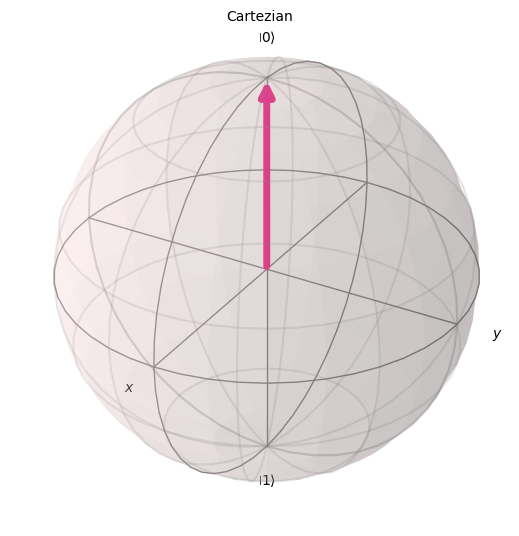

In [10]:
plot_bloch_vector([0,0,1], title="Cartezian"); # Cartezian coordinates are the default

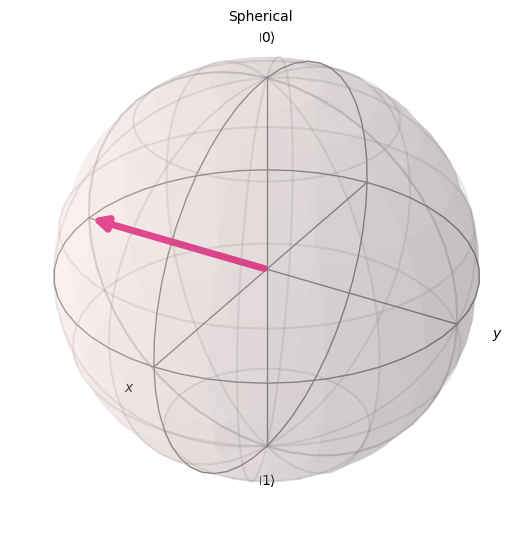

In [16]:
plot_bloch_vector([1,pi/2,3*pi/2], title="Spherical", coord_type='spherical'); # Using spherical coordinates [r=1,theta,phi]

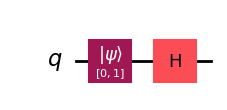

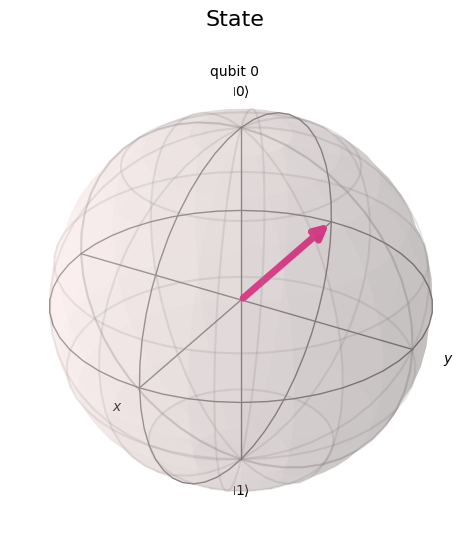

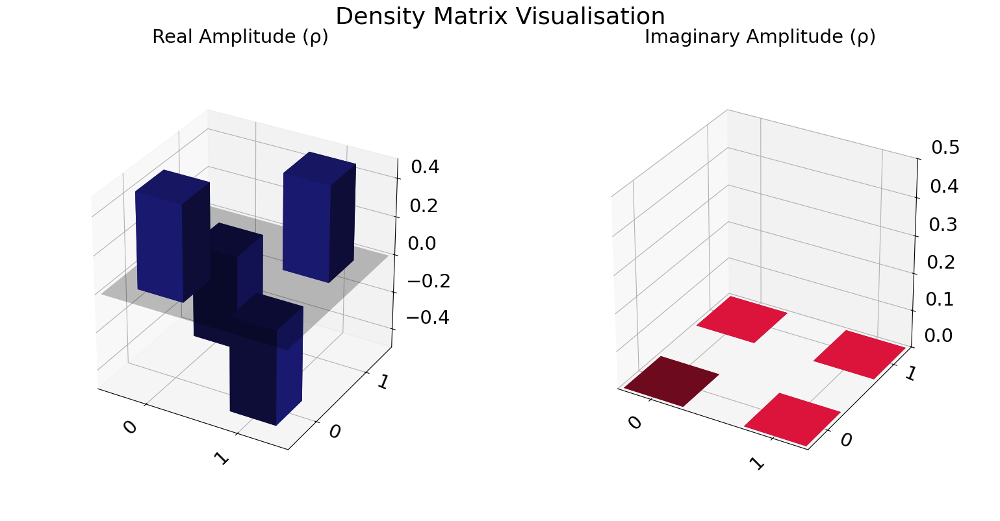

In [28]:
qc = QuantumCircuit(1)
initial_state = [0,1]   # Define initial_state as |1>. Must be normalized, |0> = [1,0]; |1> = [0,1]  !!!
qc.initialize(initial_state, 0) # Apply initialisation operation to the 0th qubit
qc.h(0) # Add Hadamard gate
qc.draw("mpl")

state = Statevector.from_instruction(qc)
plot_bloch_multivector(state, title="State");
plot_state_city(state, color=['midnightblue', 'crimson'], title="Density Matrix Visualisation");




# Example II. Animation of applying single qubit gates on Bloch sphere (might be outdated)

* circuit needs to be just one qubit circuit
* spg = seconds per gate
* fpg = frames per gate
* trace - boolean if intermediate positions should be marked with dots

In [29]:
from qiskit.visualization import visualize_transition
from qiskit import *

qc = QuantumCircuit(1)
qc.x(0)
qc.h(0)

visualize_transition(qc, fpg=40, spg=2, trace=True)

/var/folders/p5/wx0ftqrd641f8zbzx80d2hc00000gn/T/ipykernel_76514/335252974.py:8: DeprecationWarning: The function ``qiskit.visualization.transition_visualization.visualize_transition()`` is deprecated as of Qiskit 1.2.0. It will be removed in the 2.0 release.
  visualize_transition(qc, fpg=40, spg=2, trace=True)


# Example III Qiskit ```qsphere``` and Bloch sphere

<IPython.core.display.Latex object>

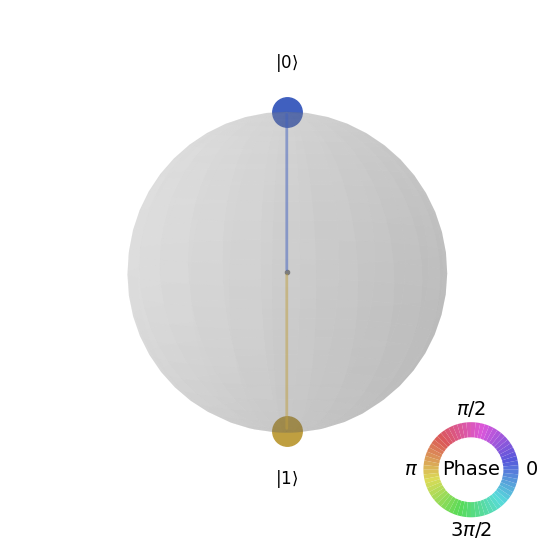

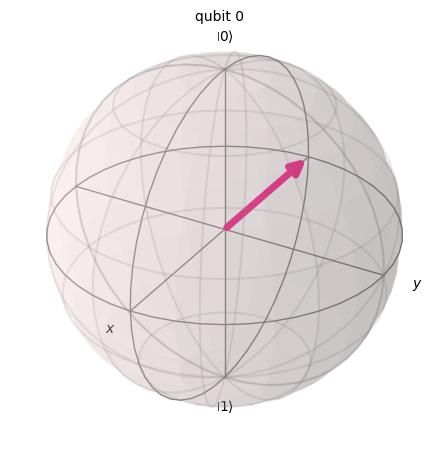

In [35]:

qc = QuantumCircuit(1)
qc.x(0)
qc.h(0)

state = Statevector.from_instruction(qc)
display(state.draw('latex'))
state.draw('qsphere');
state.draw('bloch');

# Example IV. Qubit state measurement in different basis
## Theoretical Introduction
A qubit's state can be measured by projecting it onto any axis that intersects the center of the Bloch sphere. In practice, the three independent basis measurements correspond to the X, Y, and Z axes. For more details, see Quantum Algorithm Implementations for Beginners (chapter about "QUANTUM TOMOGRAPHY").

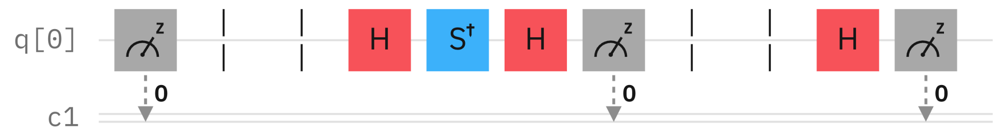


The circuit snippets above (separated by ||) show how to implement Z, Y, and X basis measurements, respectively.

On IBM Quantum hardware, measurements can only be performed in the computational basis (the Z-basis). To measure a qubit in the X or Y basis, we must perform a basis change—applying the appropriate quantum gates to rotate the target axis onto the Z-axis before measuring.

Additionally, remember that measuring a qubit causes wave function collapse, immediately destroying any quantum entanglement associated with it.

## Example V. Multi-qubit states representation on the Qsphere

<IPython.core.display.Latex object>

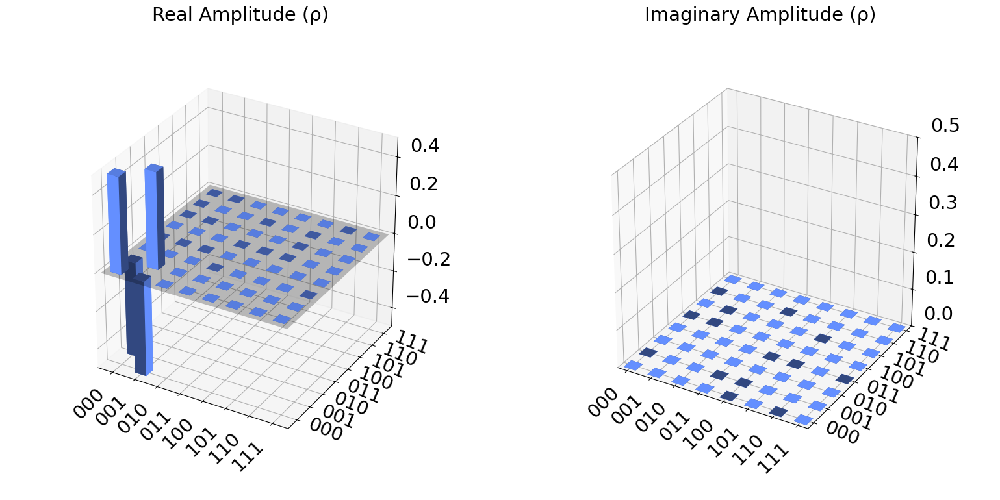

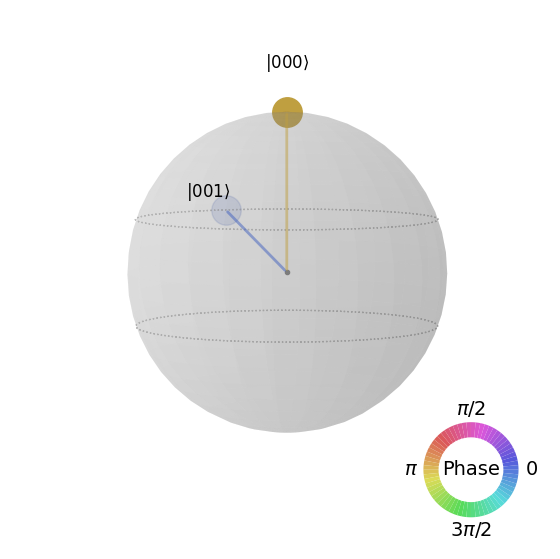

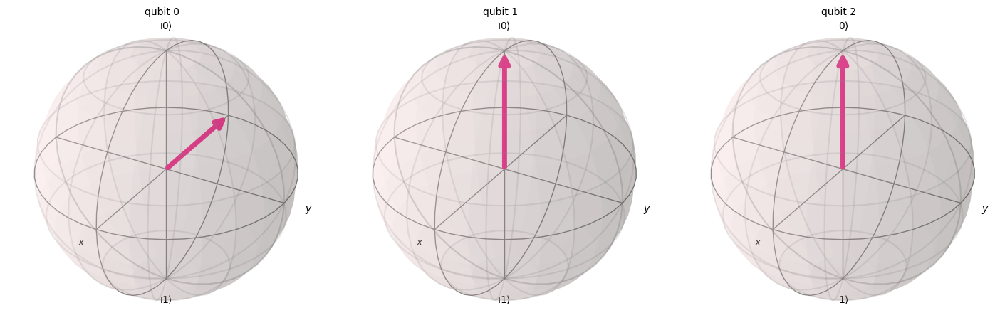

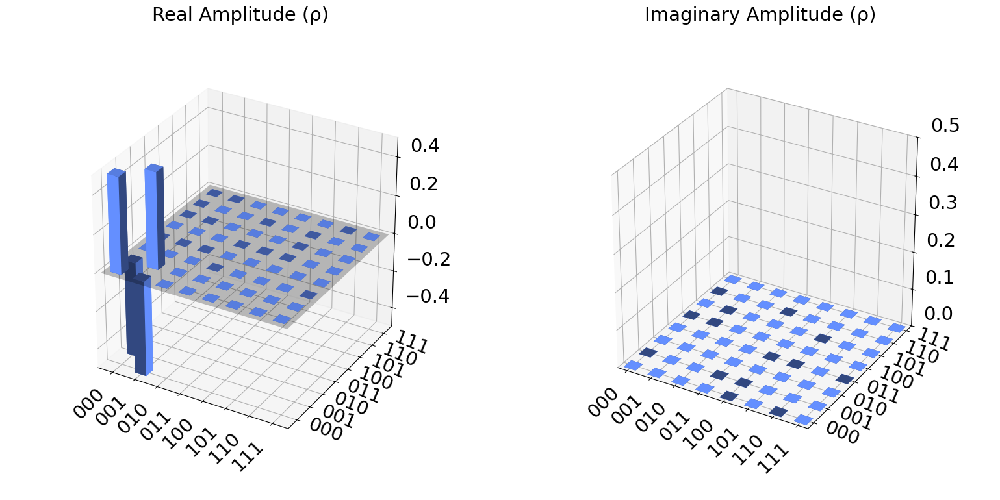

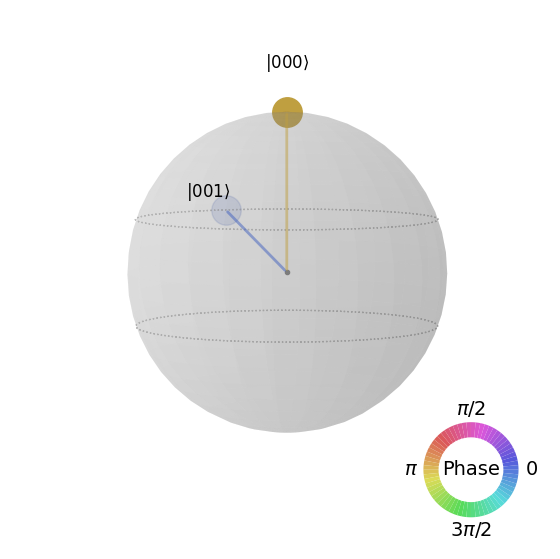

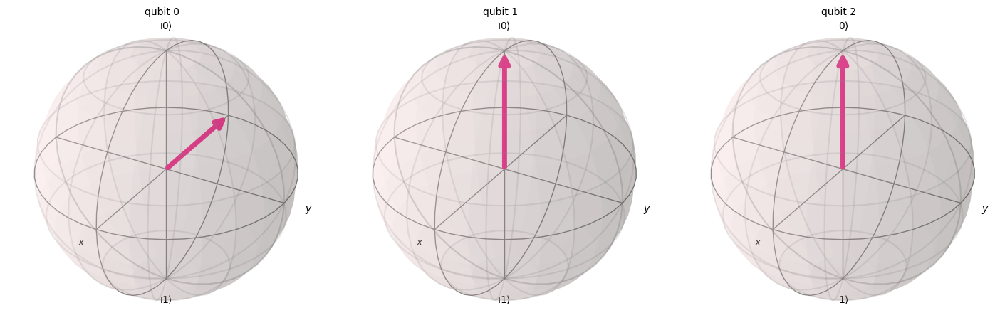

In [48]:
qc = QuantumCircuit(3)
qc.x(0)
qc.h(0)
#qc.rz(pi/2,0)
qc.draw()

state = Statevector.from_instruction(qc)
display(state.draw('latex', prefix="|\\Psi\\rangle="))

display(state.draw('city'))
display(state.draw('qsphere'));
display(state.draw('bloch'));


# Example VI.  Getting matrix representation of quantum gates:

In [49]:
from qiskit.quantum_info import Operator
qc = QuantumCircuit(2)
qc.h(0)
qc.x(1)
U = Operator(qc)
# Show the results
print(U.data)

[[ 0.        +0.j  0.        +0.j  0.70710678+0.j  0.70710678+0.j]
 [ 0.        +0.j  0.        +0.j  0.70710678+0.j -0.70710678+0.j]
 [ 0.70710678+0.j  0.70710678+0.j  0.        +0.j  0.        +0.j]
 [ 0.70710678+0.j -0.70710678+0.j  0.        +0.j  0.        +0.j]]


In [50]:
from qiskit.visualization import array_to_latex
array_to_latex(U.data)

<IPython.core.display.Latex object>

In [51]:
qc = QuantumCircuit(2)
qc.h(0)
state = Statevector.from_instruction(qc)
state.draw('latex')

<IPython.core.display.Latex object>

# Example VII Defining custom gates from operators
Unitary operations can be defined in Qiskit using the ```Operator``` class, as in the example that follows. This class includes a ```draw``` method with similar arguments to ```Statevector```. Note that the latex option produces results equivalent to ```array_to_latex```.

In [57]:
from qiskit.quantum_info import Operator

X = Operator([[0, 1], [1, 0]])
Y = Operator([[0, -1.0j], [1.0j, 0]])
H = Operator([[1 / sqrt(2), 1 / sqrt(2)], [1 / sqrt(2), -1 / sqrt(2)]])
S = Operator([[1, 0], [0, 1.0j]])
T = Operator([[1, 0], [0, (1 + 1.0j) / sqrt(2)]])

display(X.draw("latex", prefix="X="))
display(T.draw("latex", prefix="T="))
display(S.draw("latex", prefix="S="))
display(H.draw("latex", prefix="H="))
display(Y.draw("latex", prefix="Y="))

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [64]:
v = Statevector([1, 0])
v = v.evolve(H)
display(v.draw("latex"))

<IPython.core.display.Latex object>

Creating custom gates from circuits

In [61]:
my_circuit = QuantumCircuit(3, name="My gate")
my_circuit.cx(0,1)
my_circuit.cx(1,2)
my_circuit.cx(0,1)
my_circuit.cx(1,2)

my_circuit.draw()


q_0: ──■─────────■───────
     ┌─┴─┐     ┌─┴─┐     
q_1: ┤ X ├──■──┤ X ├──■──
     └───┘┌─┴─┐└───┘┌─┴─┐
q_2: ─────┤ X ├─────┤ X ├
          └───┘     └───┘

In [62]:
my_gate = my_circuit.to_instruction()

In [63]:
new_circuit = QuantumCircuit(4)

new_circuit.append(my_gate, [0,1,2])

new_circuit.draw()

┌──────────┐
q_0: ┤0         ├
     │          │
q_1: ┤1 My gate ├
     │          │
q_2: ┤2         ├
     └──────────┘
q_3: ────────────